<a href="https://colab.research.google.com/github/mhmtszr/Turkish-Car-Plate-Recognition/blob/master/Main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**GPU-MAIN Memory Information**

*   I used GPU for hardware accelarator because I didn't use Tensorflow in my project also Tensorflow2.0 is not fully supported TPU.



 

In [0]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

TensorFlow 2.x selected.
Found GPU at: /device:GPU:0


In [0]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 1718634510390612620, name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 1100644910199099491
 physical_device_desc: "device: XLA_CPU device", name: "/device:XLA_GPU:0"
 device_type: "XLA_GPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 15803496113569224951
 physical_device_desc: "device: XLA_GPU device", name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 15956099072
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 12475017791690903145
 physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"]

In [0]:
!cat /proc/meminfo

MemTotal:       13335188 kB
MemFree:         9954540 kB
MemAvailable:   12239800 kB
Buffers:           77632 kB
Cached:          2320468 kB
SwapCached:            0 kB
Active:           804740 kB
Inactive:        2153208 kB
Active(anon):     492832 kB
Inactive(anon):     8520 kB
Active(file):     311908 kB
Inactive(file):  2144688 kB
Unevictable:           0 kB
Mlocked:               0 kB
SwapTotal:             0 kB
SwapFree:              0 kB
Dirty:               260 kB
Writeback:             0 kB
AnonPages:        559856 kB
Mapped:           456152 kB
Shmem:              9088 kB
Slab:             179404 kB
SReclaimable:     139144 kB
SUnreclaim:        40260 kB
KernelStack:        3772 kB
PageTables:         6788 kB
NFS_Unstable:          0 kB
Bounce:                0 kB
WritebackTmp:          0 kB
CommitLimit:     6667592 kB
Committed_AS:    3076544 kB
VmallocTotal:   34359738367 kB
VmallocUsed:           0 kB
VmallocChunk:          0 kB
AnonHugePages:         0 kB
ShmemHugePages:  

**CONNECT TO DRIVE**

*   To train and test my model I connected colab to my Google Drive.





In [0]:
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse
from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass
!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}

E: Package 'python-software-properties' has no installation candidate
Selecting previously unselected package google-drive-ocamlfuse.
(Reading database ... 135718 files and directories currently installed.)
Preparing to unpack .../google-drive-ocamlfuse_0.7.14-0ubuntu1~ubuntu18.04.1_amd64.deb ...
Unpacking google-drive-ocamlfuse (0.7.14-0ubuntu1~ubuntu18.04.1) ...
Setting up google-drive-ocamlfuse (0.7.14-0ubuntu1~ubuntu18.04.1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&approval_prompt=force
··········
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope

In [0]:
!mkdir -p drive
!google-drive-ocamlfuse drive

In [0]:
import sys
sys.path.insert(0, 'drive/OPLOG')

In [0]:
f = open("drive/OPLOG/Example.txt", "r")       #Test if it is connected
print(f.read())

Mehmet Sezer


In [0]:
import cv2
print(cv2.__version__)

4.1.2


#**KNN Character Recognition**

*   There is a problem in colab by using cv2.imshow(). "google.colab.patches import cv2_imshow" library must be imported to fix. But it is very slow so i just make comment it.
*   KNN is a Machine Learning Classification Algorithm and it is compatible with my problem. I used it for Character Recognition(Optical Character Recognition(OCR))
*   OCR technology is used to convert virtually any kind of images containing written text (typed, handwritten or printed) into machine-readable text data. I used matrix matching technique.
* I choose KNN algorithm because complexity of algorithm for training O(nk) and for testing O(n). So It is a efficient algorithm according to this problem.
* https://drive.google.com/uc?id=1xi9nY7JOmsYwglbG6ioyx4Q_9U7FcWAd































In [0]:
import sys
import numpy as np
import os
from google.colab.patches import cv2_imshow


kNearest = cv2.ml.KNearest_create()
def loadKNNDataAndTrainKNN():
    allContoursWithData = []                # declare empty lists,
    validContoursWithData = []              # we will fill these shortly

    try:
        npaClassifications = np.loadtxt("drive/OPLOG/classifications.txt", np.float32)                  # read in training classifications
    except:                                                                                 # if file could not be opened
        print("error, unable to open classifications.txt, exiting program\n")  # show error message
        os.system("pause")
        return False                                                                        # and return False

    try:
        npaFlattenedImages = np.loadtxt("drive/OPLOG/flattened_images.txt", np.float32)                 # read in training images
    except:                                                                                 # if file could not be opened
        print("error, unable to open flattened_images.txt, exiting program\n")  # show error message
        os.system("pause")
        return False                                                                        # and return False
    

    npaClassifications = npaClassifications.reshape((npaClassifications.size, 1))       # reshape numpy array to 1d, necessary to pass to call to train

    kNearest.setDefaultK(1)                                                             # set default K to 1

    kNearest.train(npaFlattenedImages, cv2.ml.ROW_SAMPLE, npaClassifications)           # train KNN object
    print("Training Complete")
    return True                             # if we got here training was successful so return true


In [0]:
MIN_CONTOUR_AREA = 100

RESIZED_IMAGE_WIDTH = 20
RESIZED_IMAGE_HEIGHT = 30
#user input (We can't use cv2.imshow() in Colab because of that I will input it manually)
TRAIN_RULE = "ZTRPMFEDBAYXWVUSQONLKJIHGC9876532041RPMDBAZYXWVUTSQONLKJIHGFEC4198765320ZYXWVUTSRQPONMLKJIHGFEDCBA9876543210ZYXWVUTRPNMLKJIHFEDBASQOGC7321986540RPMDBAZYXWVUTSQONLKJIHGFEC7549863210"
TRAIN_INDEX = 0

imgTrainingNumbers = cv2.imread("drive/OPLOG/training_chars.png")            # read in training numbers image

if imgTrainingNumbers is None:                          # if image was not read successfully
    print ("error: image not read from file \n\n")        # print error message to std out
    os.system("pause")                                  # pause so user can see error message
                                              

imgGray = cv2.cvtColor(imgTrainingNumbers, cv2.COLOR_BGR2GRAY)          # get grayscale image
imgBlurred = cv2.GaussianBlur(imgGray, (5,5), 0)                        # blur

                                                    # filter image from grayscale to black and white
imgThresh = cv2.adaptiveThreshold(imgBlurred,                           # input image
                                  255,                                  # make pixels that pass the threshold full white
                                  cv2.ADAPTIVE_THRESH_GAUSSIAN_C,       # use gaussian rather than mean, seems to give better results
                                  cv2.THRESH_BINARY_INV,                # invert so foreground will be white, background will be black
                                  11,                                   # size of a pixel neighborhood used to calculate threshold value
                                  2)                                    # constant subtracted from the mean or weighted mean

#cv2.imshow("imgThresh", imgThresh)      # show threshold image for reference

imgThreshCopy = imgThresh.copy()        # make a copy of the thresh image, this in necessary b/c findContours modifies the image
#for cv2 version3
#imgContours, npaContours, npaHierarchy = cv2.findContours(imgThreshCopy,        # input image, make sure to use a copy since the function will modify this image in the course of finding contours
                                              #cv2.RETR_EXTERNAL,                 # retrieve the outermost contours only
                                              #cv2.CHAIN_APPROX_SIMPLE)           # compress horizontal, vertical, and diagonal segments and leave only their end points

npaContours, npaHierarchy = cv2.findContours(imgThreshCopy,        # input image, make sure to use a copy since the function will modify this image in the course of finding contours
                                                 cv2.RETR_EXTERNAL,                 # retrieve the outermost contours only
                                                 cv2.CHAIN_APPROX_SIMPLE)           # compress horizontal, vertical, and diagonal segments and leave only their end points


                            # declare empty numpy array, we will use this to write to file later
                            # zero rows, enough cols to hold all image data
npaFlattenedImages =  np.empty((0, RESIZED_IMAGE_WIDTH * RESIZED_IMAGE_HEIGHT))

intClassifications = []         # declare empty classifications list, this will be our list of how we are classifying our chars from user input, we will write to file at the end

for npaContour in npaContours:                          # for each contour
    if cv2.contourArea(npaContour) > MIN_CONTOUR_AREA:          # if contour is big enough to consider
        [intX, intY, intW, intH] = cv2.boundingRect(npaContour)         # get and break out bounding rect

                                            # draw rectangle around each contour as we ask user for input
        cv2.rectangle(imgTrainingNumbers,           # draw rectangle on original training image
                      (intX, intY),                 # upper left corner
                      (intX+intW,intY+intH),        # lower right corner
                      (0, 0, 255),                  # red
                      2)                            # thickness

        imgROI = imgThresh[intY:intY+intH, intX:intX+intW]                                  # crop char out of threshold image
        imgROIResized = cv2.resize(imgROI, (RESIZED_IMAGE_WIDTH, RESIZED_IMAGE_HEIGHT))     # resize image, this will be more consistent for recognition and storage


        intChar = ord(TRAIN_RULE[TRAIN_INDEX])                     # ASCII value of train
        TRAIN_INDEX += 1

        intClassifications.append(intChar)                                                # append classification char to integer list of chars (we will convert to float later before writing to file)

        npaFlattenedImage = imgROIResized.reshape((1, RESIZED_IMAGE_WIDTH * RESIZED_IMAGE_HEIGHT))  # flatten image to 1d numpy array so we can write to file later
        npaFlattenedImages = np.append(npaFlattenedImages, npaFlattenedImage, 0)                    # add current flattened impage numpy array to list of flattened image numpy arrays
        

fltClassifications = np.array(intClassifications, np.float32)                   # convert classifications list of ints to numpy array of floats

npaClassifications = fltClassifications.reshape((fltClassifications.size, 1))   # flatten numpy array of floats to 1d so we can write to file later

print ("\n\nClassifications complete !!\n")

np.savetxt("drive/OPLOG/classifications.txt", npaClassifications)           # write classifications to file
np.savetxt("drive/OPLOG/flattened_images.txt", npaFlattenedImages)          #2d images
# we will use them to train our KNN

blnKNNTrainingSuccessful = loadKNNDataAndTrainKNN()         # attempt KNN training

if blnKNNTrainingSuccessful == False:                               # if KNN training was not successful
    print("\nerror: KNN traning was not successful\n")              # show error message
    sys.exit(0)                                                          # and exit program




Classifications complete !!

Training Complete


# **The Plate Read Algorithm Basically Consists of 3 Steps.**


1.   Possible plates locations determination by using normalization of image features such as brightness and contrast and finding all possible plates in images. 
2.   Recognize text of possible plates by using KNN model which we created before and take largest one.(It will be the most recognized chars.)
3.   Main Function to implement all of them.

https://drive.google.com/open?id=1QmsiWlAmRQIdUR0dzEfObjtsyqXnoFet



In [0]:
import math
import random
import time

class PossiblePlate:

    def __init__(self):
        self.imgPlate = None
        self.imgGrayscale = None
        self.imgThresh = None

        self.rrLocationOfPlateInScene = None

        self.strChars = ""
    

class PossibleChar:

    def __init__(self, _contour):
        self.contour = _contour

        self.boundingRect = cv2.boundingRect(self.contour)

        [intX, intY, intWidth, intHeight] = self.boundingRect

        self.intBoundingRectX = intX
        self.intBoundingRectY = intY
        self.intBoundingRectWidth = intWidth
        self.intBoundingRectHeight = intHeight

        self.intBoundingRectArea = self.intBoundingRectWidth * self.intBoundingRectHeight

        self.intCenterX = (self.intBoundingRectX + self.intBoundingRectX + self.intBoundingRectWidth) / 2
        self.intCenterY = (self.intBoundingRectY + self.intBoundingRectY + self.intBoundingRectHeight) / 2

        self.fltDiagonalSize = math.sqrt((self.intBoundingRectWidth ** 2) + (self.intBoundingRectHeight ** 2))

        self.fltAspectRatio = float(self.intBoundingRectWidth) / float(self.intBoundingRectHeight)
    

        # constants for checkIfPossibleChar, this checks one possible char only (does not compare to another char)
MIN_PIXEL_WIDTH = 2
MIN_PIXEL_HEIGHT = 8

MIN_ASPECT_RATIO = 0.25
MAX_ASPECT_RATIO = 1.0

MIN_PIXEL_AREA = 80

        # constants for comparing two chars
MIN_DIAG_SIZE_MULTIPLE_AWAY = 0.3
MAX_DIAG_SIZE_MULTIPLE_AWAY = 5.0

MAX_CHANGE_IN_AREA = 0.5

MAX_CHANGE_IN_WIDTH = 0.8
MAX_CHANGE_IN_HEIGHT = 0.2

MAX_ANGLE_BETWEEN_CHARS = 12.0

        # other constants
MIN_NUMBER_OF_MATCHING_CHARS = 3

RESIZED_CHAR_IMAGE_WIDTH = 20
RESIZED_CHAR_IMAGE_HEIGHT = 30

MIN_CONTOUR_AREA = 100

PLATE_WIDTH_PADDING_FACTOR = 1.3
PLATE_HEIGHT_PADDING_FACTOR = 1.5

GAUSSIAN_SMOOTH_FILTER_SIZE = (5, 5)
ADAPTIVE_THRESH_BLOCK_SIZE = 19
ADAPTIVE_THRESH_WEIGHT = 9



##**1. Possible plates locations determination by using normalization of image features such as brightness and contrast and finding all possible plates in images.**

In [0]:
def detectPlatesInScene(imgOriginalScene):       #return possible plates locations 
    listOfPossiblePlates = []                   # this will be the return value

    height, width, numChannels = imgOriginalScene.shape

    imgGrayscaleScene = np.zeros((height, width, 1), np.uint8)
    imgThreshScene = np.zeros((height, width, 1), np.uint8)
    imgContours = np.zeros((height, width, 3), np.uint8)

    cv2.destroyAllWindows()

    if showSteps == True:
        print("Origal Image") 
        cv2_imshow(imgOriginalScene)
    

    imgGrayscaleScene, imgThreshScene = preprocess(imgOriginalScene)         # preprocess to get grayscale and threshold images

    if showSteps == True:
        print("Gray Image") 
        cv2_imshow(imgGrayscaleScene)
        print("Thresh Image") 
        cv2_imshow(imgThreshScene)

            # find all possible chars in the scene,
            # this function first finds all contours, then only includes contours that could be chars (without comparison to other chars yet)
    listOfPossibleCharsInScene = findPossibleCharsInScene(imgThreshScene)   #find all chars in image

    if showSteps == True:
        print("step 2 - len(listOfPossibleCharsInScene) = " + str(
            len(listOfPossibleCharsInScene)))  # 131 with MCLRNF1 image

        imgContours = np.zeros((height, width, 3), np.uint8)

        contours = []

        for possibleChar in listOfPossibleCharsInScene:
            contours.append(possibleChar.contour)
        

        cv2.drawContours(imgContours, contours, -1, SCALAR_WHITE)
        cv2_imshow(imgContours)

            # given a list of all possible chars, find groups of matching chars
            # in the next steps each group of matching chars will attempt to be recognized as a plate
    listOfListsOfMatchingCharsInScene = findListOfListsOfMatchingChars(listOfPossibleCharsInScene)  #group of matching chars(update charsInScene)

    if showSteps == True: 
        print("step 3 - listOfListsOfMatchingCharsInScene.Count = " + str(
            len(listOfListsOfMatchingCharsInScene)))  # 13 with MCLRNF1 image

        imgContours = np.zeros((height, width, 3), np.uint8)

        for listOfMatchingChars in listOfListsOfMatchingCharsInScene:
            intRandomBlue = random.randint(0, 255)
            intRandomGreen = random.randint(0, 255)
            intRandomRed = random.randint(0, 255)

            contours = []

            for matchingChar in listOfMatchingChars:
                contours.append(matchingChar.contour)
            

            cv2.drawContours(imgContours, contours, -1, (intRandomBlue, intRandomGreen, intRandomRed))
        
        print("Contours")
        cv2_imshow(imgContours)
    

    for listOfMatchingChars in listOfListsOfMatchingCharsInScene:                   # for each group of matching chars
        possiblePlate = extractPlate(imgOriginalScene, listOfMatchingChars)         # attempt to extract plate(is it like plate or not?)

        if possiblePlate.imgPlate is not None:                          # if plate was found
            listOfPossiblePlates.append(possiblePlate)                  # add to list of possible plates
        

    
    if showSteps == True: 
        print("\n")
        print("Contours")
        cv2_imshow(imgContours)

        for i in range(0, len(listOfPossiblePlates)):
            p2fRectPoints = cv2.boxPoints(listOfPossiblePlates[i].rrLocationOfPlateInScene)

            cv2.line(imgContours, tuple(p2fRectPoints[0]), tuple(p2fRectPoints[1]), SCALAR_RED, 2)
            cv2.line(imgContours, tuple(p2fRectPoints[1]), tuple(p2fRectPoints[2]), SCALAR_RED, 2)
            cv2.line(imgContours, tuple(p2fRectPoints[2]), tuple(p2fRectPoints[3]), SCALAR_RED, 2)
            cv2.line(imgContours, tuple(p2fRectPoints[3]), tuple(p2fRectPoints[0]), SCALAR_RED, 2)
            print("Contours")
            cv2_imshow(imgContours)
            print("Possible Plate")
            cv2_imshow(listOfPossiblePlates[i].imgPlate)
            #cv2.waitKey(0)

        #cv2.waitKey(0)
    

    return listOfPossiblePlates



def preprocess(imgOriginal):          #grayscale,threshold
    imgGrayscale = extractValue(imgOriginal)

    imgMaxContrastGrayscale = maximizeContrast(imgGrayscale)

    height, width = imgGrayscale.shape

    imgBlurred = np.zeros((height, width, 1), np.uint8)

    imgBlurred = cv2.GaussianBlur(imgMaxContrastGrayscale, GAUSSIAN_SMOOTH_FILTER_SIZE, 0)

    imgThresh = cv2.adaptiveThreshold(imgBlurred, 255.0, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, ADAPTIVE_THRESH_BLOCK_SIZE, ADAPTIVE_THRESH_WEIGHT)

    return imgGrayscale, imgThresh

def extractValue(imgOriginal):
    height, width, numChannels = imgOriginal.shape

    imgHSV = np.zeros((height, width, 3), np.uint8)

    imgHSV = cv2.cvtColor(imgOriginal, cv2.COLOR_BGR2HSV)

    imgHue, imgSaturation, imgValue = cv2.split(imgHSV)

    return imgValue

def maximizeContrast(imgGrayscale):

    height, width = imgGrayscale.shape

    imgTopHat = np.zeros((height, width, 1), np.uint8)
    imgBlackHat = np.zeros((height, width, 1), np.uint8)

    structuringElement = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

    imgTopHat = cv2.morphologyEx(imgGrayscale, cv2.MORPH_TOPHAT, structuringElement)
    imgBlackHat = cv2.morphologyEx(imgGrayscale, cv2.MORPH_BLACKHAT, structuringElement)

    imgGrayscalePlusTopHat = cv2.add(imgGrayscale, imgTopHat)
    imgGrayscalePlusTopHatMinusBlackHat = cv2.subtract(imgGrayscalePlusTopHat, imgBlackHat)

    return imgGrayscalePlusTopHatMinusBlackHat


def findPossibleCharsInScene(imgThresh):    #find all chars in image
    listOfPossibleChars = []                # this will be the return value

    intCountOfPossibleChars = 0

    imgThreshCopy = imgThresh.copy()
    #for opencv3
    #imgContours, contours, npaHierarchy = cv2.findContours(imgThreshCopy, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)   # find all contours
    contours, npaHierarchy = cv2.findContours(imgThreshCopy, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)   # find all contours
    height, width = imgThresh.shape
    imgContours = np.zeros((height, width, 3), np.uint8)

    for i in range(0, len(contours)):                       # for each contour

        if showSteps == True: 
            cv2.drawContours(imgContours, contours, i, SCALAR_WHITE)
        

        possibleChar = PossibleChar(contours[i])

        if checkIfPossibleChar(possibleChar):                   # if contour is a possible char, note this does not compare to other chars (yet) . . .
            intCountOfPossibleChars = intCountOfPossibleChars + 1           # increment count of possible chars
            listOfPossibleChars.append(possibleChar)                        # and add to list of possible chars
        

    if showSteps == True:
        print("\nstep 2 - len(contours) = " + str(len(contours)))  # 2362 with MCLRNF1 image
        print("step 2 - intCountOfPossibleChars = " + str(intCountOfPossibleChars))  # 131 with MCLRNF1 image
        print("Contours")
        cv2_imshow(imgContours)
   

    return listOfPossibleChars

    
def findListOfListsOfMatchingChars(listOfPossibleChars):      #chars should be in group
            # with this function, we start off with all the possible chars in one big list
            # the purpose of this function is to re-arrange the one big list of chars into a list of lists of matching chars,
            # note that chars that are not found to be in a group of matches do not need to be considered further
    listOfListsOfMatchingChars = []                  # this will be the return value

    for possibleChar in listOfPossibleChars:                        # for each possible char in the one big list of chars
        listOfMatchingChars = findListOfMatchingChars(possibleChar, listOfPossibleChars)        # find all chars in the big list that match the current char

        listOfMatchingChars.append(possibleChar)                # also add the current char to current possible list of matching chars

        if len(listOfMatchingChars) < MIN_NUMBER_OF_MATCHING_CHARS:     # if current possible list of matching chars is not long enough to constitute a possible plate
            continue                            # jump back to the top of the for loop and try again with next char, note that it's not necessary
                                                # to save the list in any way since it did not have enough chars to be a possible plate

                                                # if we get here, the current list passed test as a "group" or "cluster" of matching chars
        listOfListsOfMatchingChars.append(listOfMatchingChars)      # so add to our list of lists of matching chars

        listOfPossibleCharsWithCurrentMatchesRemoved = []

                                                # remove the current list of matching chars from the big list so we don't use those same chars twice,
                                                # make sure to make a new big list for this since we don't want to change the original big list
        listOfPossibleCharsWithCurrentMatchesRemoved = list(set(listOfPossibleChars) - set(listOfMatchingChars))

        recursiveListOfListsOfMatchingChars = findListOfListsOfMatchingChars(listOfPossibleCharsWithCurrentMatchesRemoved)      # recursive call

        for recursiveListOfMatchingChars in recursiveListOfListsOfMatchingChars:        # for each list of matching chars found by recursive call
            listOfListsOfMatchingChars.append(recursiveListOfMatchingChars)             # add to our original list of lists of matching chars
      
        break       

    return listOfListsOfMatchingChars

def extractPlate(imgOriginal, listOfMatchingChars):   #possible plate
    possiblePlate = PossiblePlate()           # this will be the return value

    listOfMatchingChars.sort(key = lambda matchingChar: matchingChar.intCenterX)        # sort chars from left to right based on x position

            # calculate the center point of the plate
    fltPlateCenterX = (listOfMatchingChars[0].intCenterX + listOfMatchingChars[len(listOfMatchingChars) - 1].intCenterX) / 2.0
    fltPlateCenterY = (listOfMatchingChars[0].intCenterY + listOfMatchingChars[len(listOfMatchingChars) - 1].intCenterY) / 2.0

    ptPlateCenter = fltPlateCenterX, fltPlateCenterY

            # calculate plate width and height
    intPlateWidth = int((listOfMatchingChars[len(listOfMatchingChars) - 1].intBoundingRectX + listOfMatchingChars[len(listOfMatchingChars) - 1].intBoundingRectWidth - listOfMatchingChars[0].intBoundingRectX) * PLATE_WIDTH_PADDING_FACTOR)

    intTotalOfCharHeights = 0

    for matchingChar in listOfMatchingChars:
        intTotalOfCharHeights = intTotalOfCharHeights + matchingChar.intBoundingRectHeight
    # end for

    fltAverageCharHeight = intTotalOfCharHeights / len(listOfMatchingChars)

    intPlateHeight = int(fltAverageCharHeight * PLATE_HEIGHT_PADDING_FACTOR)

            # calculate correction angle of plate region
    fltOpposite = listOfMatchingChars[len(listOfMatchingChars) - 1].intCenterY - listOfMatchingChars[0].intCenterY
    fltHypotenuse = distanceBetweenChars(listOfMatchingChars[0], listOfMatchingChars[len(listOfMatchingChars) - 1])
    fltCorrectionAngleInRad = math.asin(fltOpposite / fltHypotenuse)
    fltCorrectionAngleInDeg = fltCorrectionAngleInRad * (180.0 / math.pi)

            # pack plate region center point, width and height, and correction angle into rotated rect member variable of plate
    possiblePlate.rrLocationOfPlateInScene = ( tuple(ptPlateCenter), (intPlateWidth, intPlateHeight), fltCorrectionAngleInDeg )

            # final steps are to perform the actual rotation

            # get the rotation matrix for our calculated correction angle
    rotationMatrix = cv2.getRotationMatrix2D(tuple(ptPlateCenter), fltCorrectionAngleInDeg, 1.0)

    height, width, numChannels = imgOriginal.shape      # unpack original image width and height

    imgRotated = cv2.warpAffine(imgOriginal, rotationMatrix, (width, height))       # rotate the entire image

    imgCropped = cv2.getRectSubPix(imgRotated, (intPlateWidth, intPlateHeight), tuple(ptPlateCenter))

    possiblePlate.imgPlate = imgCropped         # copy the cropped plate image into the applicable member variable of the possible plate

    return possiblePlate



## **2. Recognize text of possible plates by using KNN model which we created before and take largest one.(It will be the most recognized chars.)**

In [0]:
def detectCharsInPlates(listOfPossiblePlates):
    intPlateCounter = 0
    imgContours = None
    contours = []

    if len(listOfPossiblePlates) == 0:          # if list of possible plates is empty
        return listOfPossiblePlates             
    

            # at this point we can be sure the list of possible plates has at least one plate

    for possiblePlate in listOfPossiblePlates:          # for each possible plate, this is a big for loop that takes up most of the function

        possiblePlate.imgGrayscale, possiblePlate.imgThresh = preprocess(possiblePlate.imgPlate)     # preprocess to get grayscale and threshold images

        if showSteps == True:
            print("Possible Plate") 
            cv2_imshow(possiblePlate.imgPlate)
            cv2_imshow(possiblePlate.imgGrayscale)
            cv2_imshow(possiblePlate.imgThresh)
        

                # increase size of plate image for easier viewing and char detection
        possiblePlate.imgThresh = cv2.resize(possiblePlate.imgThresh, (0, 0), fx = 1.6, fy = 1.6)

                # threshold again to eliminate any gray areas
        thresholdValue, possiblePlate.imgThresh = cv2.threshold(possiblePlate.imgThresh, 0.0, 255.0, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

        if showSteps == True:
            cv2_imshow(possiblePlate.imgThresh)
        

                # find all possible chars in the plate,
                # this function first finds all contours, then only includes contours that could be chars (without comparison to other chars yet)
        listOfPossibleCharsInPlate = findPossibleCharsInPlate(possiblePlate.imgGrayscale, possiblePlate.imgThresh)

        if showSteps == True:
            height, width, numChannels = possiblePlate.imgPlate.shape
            imgContours = np.zeros((height, width, 3), np.uint8)
            del contours[:]                                         # clear the contours list

            for possibleChar in listOfPossibleCharsInPlate:
                contours.append(possibleChar.contour)

            cv2.drawContours(imgContours, contours, -1, SCALAR_WHITE)

            cv2_imshow(imgContours)

                # given a list of all possible chars, find groups of matching chars within the plate
        listOfListsOfMatchingCharsInPlate = findListOfListsOfMatchingChars(listOfPossibleCharsInPlate)

        if showSteps == True:
            imgContours = np.zeros((height, width, 3), np.uint8)
            del contours[:]

            for listOfMatchingChars in listOfListsOfMatchingCharsInPlate:
                intRandomBlue = random.randint(0, 255)
                intRandomGreen = random.randint(0, 255)
                intRandomRed = random.randint(0, 255)

                for matchingChar in listOfMatchingChars:
                    contours.append(matchingChar.contour)
                cv2.drawContours(imgContours, contours, -1, (intRandomBlue, intRandomGreen, intRandomRed))
            cv2_imshow(imgContours)

        if (len(listOfListsOfMatchingCharsInPlate) == 0):			# if no groups of matching chars were found in the plate

            if showSteps == True: 
                print("chars found in plate number " + str(
                    intPlateCounter))
                
                intPlateCounter = intPlateCounter + 1
                
                #cv2.waitKey(0)
            

            possiblePlate.strChars = ""
            continue						# go back to top of for loop
        

        for i in range(0, len(listOfListsOfMatchingCharsInPlate)):                              # within each list of matching chars
            listOfListsOfMatchingCharsInPlate[i].sort(key = lambda matchingChar: matchingChar.intCenterX)        # sort chars from left to right
            listOfListsOfMatchingCharsInPlate[i] = removeInnerOverlappingChars(listOfListsOfMatchingCharsInPlate[i])              # and remove inner overlapping chars

        if showSteps == True: # show steps ###################################################
            imgContours = np.zeros((height, width, 3), np.uint8)

            for listOfMatchingChars in listOfListsOfMatchingCharsInPlate:
                intRandomBlue = random.randint(0, 255)
                intRandomGreen = random.randint(0, 255)
                intRandomRed = random.randint(0, 255)

                del contours[:]

                for matchingChar in listOfMatchingChars:
                    contours.append(matchingChar.contour)
                

                cv2.drawContours(imgContours, contours, -1, (intRandomBlue, intRandomGreen, intRandomRed))
            
            cv2_imshow(imgContours)

                # within each possible plate, suppose the longest list of potential matching chars is the actual list of chars
        intLenOfLongestListOfChars = 0
        intIndexOfLongestListOfChars = 0

                # loop through all the vectors of matching chars, get the index of the one with the most chars
        for i in range(0, len(listOfListsOfMatchingCharsInPlate)):
            if len(listOfListsOfMatchingCharsInPlate[i]) > intLenOfLongestListOfChars:
                intLenOfLongestListOfChars = len(listOfListsOfMatchingCharsInPlate[i])
                intIndexOfLongestListOfChars = i

                # suppose that the longest list of matching chars within the plate is the actual list of chars
        longestListOfMatchingCharsInPlate = listOfListsOfMatchingCharsInPlate[intIndexOfLongestListOfChars]

        if showSteps == True: 
            imgContours = np.zeros((height, width, 3), np.uint8)
            del contours[:]

            for matchingChar in longestListOfMatchingCharsInPlate:
                contours.append(matchingChar.contour)
            

            cv2.drawContours(imgContours, contours, -1, SCALAR_WHITE)

            cv2_imshow(imgContours)
        

        possiblePlate.strChars = recognizeCharsInPlate(possiblePlate.imgThresh, longestListOfMatchingCharsInPlate)

        if showSteps == True:
            print("chars found in plate number " + str(
                intPlateCounter) + " = " + possiblePlate.strChars)
            intPlateCounter = intPlateCounter + 1
            #cv2.waitKey(0)

    if showSteps == True:
        print("\nchar detection complete,\n")
        #cv2.waitKey(0)

    return listOfPossiblePlates

def findPossibleCharsInPlate(imgGrayscale, imgThresh):
    listOfPossibleChars = []                        # this will be the return value
    contours = []
    imgThreshCopy = imgThresh.copy()

            # find all contours in plate
    #for opencv3
    #imgContours, contours, npaHierarchy = cv2.findContours(imgThreshCopy, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours, npaHierarchy = cv2.findContours(imgThreshCopy, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    for contour in contours:                        # for each contour
        possibleChar = PossibleChar(contour)

        if checkIfPossibleChar(possibleChar):              # if contour is a possible char, note this does not compare to other chars (yet) . . .
            listOfPossibleChars.append(possibleChar)       # add to list of possible chars
        

    return listOfPossibleChars

def checkIfPossibleChar(possibleChar):
            # this function is a 'first pass' that does a rough check on a contour to see if it could be a char,
            # note that we are not (yet) comparing the char to other chars to look for a group
    if (possibleChar.intBoundingRectArea > MIN_PIXEL_AREA and
        possibleChar.intBoundingRectWidth > MIN_PIXEL_WIDTH and possibleChar.intBoundingRectHeight > MIN_PIXEL_HEIGHT and
        MIN_ASPECT_RATIO < possibleChar.fltAspectRatio and possibleChar.fltAspectRatio < MAX_ASPECT_RATIO):
        return True
    else:
        return False



def findListOfMatchingChars(possibleChar, listOfChars):
            # the purpose of this function is, given a possible char and a big list of possible chars,
            # find all chars in the big list that are a match for the single possible char, and return those matching chars as a list
    listOfMatchingChars = []                # this will be the return value

    for possibleMatchingChar in listOfChars:                # for each char in big list
        if possibleMatchingChar == possibleChar:    # if the char we attempting to find matches for is the exact same char as the char in the big list we are currently checking
                                                    # then we should not include it in the list of matches b/c that would end up double including the current char
            continue                                # so do not add to list of matches and jump back to top of for loop
        
                    # compute stuff to see if chars are a match
        fltDistanceBetweenChars = distanceBetweenChars(possibleChar, possibleMatchingChar)

        fltAngleBetweenChars = angleBetweenChars(possibleChar, possibleMatchingChar)

        fltChangeInArea = float(abs(possibleMatchingChar.intBoundingRectArea - possibleChar.intBoundingRectArea)) / float(possibleChar.intBoundingRectArea)

        fltChangeInWidth = float(abs(possibleMatchingChar.intBoundingRectWidth - possibleChar.intBoundingRectWidth)) / float(possibleChar.intBoundingRectWidth)
        fltChangeInHeight = float(abs(possibleMatchingChar.intBoundingRectHeight - possibleChar.intBoundingRectHeight)) / float(possibleChar.intBoundingRectHeight)

                # check if chars match
        if (fltDistanceBetweenChars < (possibleChar.fltDiagonalSize * MAX_DIAG_SIZE_MULTIPLE_AWAY) and
            fltAngleBetweenChars < MAX_ANGLE_BETWEEN_CHARS and
            fltChangeInArea < MAX_CHANGE_IN_AREA and
            fltChangeInWidth < MAX_CHANGE_IN_WIDTH and
            fltChangeInHeight < MAX_CHANGE_IN_HEIGHT):

            listOfMatchingChars.append(possibleMatchingChar)        # if the chars are a match, add the current char to list of matching chars
        

    return listOfMatchingChars                  


# use Pythagorean theorem to calculate distance between two chars
def distanceBetweenChars(firstChar, secondChar):
    intX = abs(firstChar.intCenterX - secondChar.intCenterX)
    intY = abs(firstChar.intCenterY - secondChar.intCenterY)

    return math.sqrt((intX ** 2) + (intY ** 2))


# use basic trigonometry (SOH CAH TOA) to calculate angle between chars
def angleBetweenChars(firstChar, secondChar):
    fltAdj = float(abs(firstChar.intCenterX - secondChar.intCenterX))
    fltOpp = float(abs(firstChar.intCenterY - secondChar.intCenterY))

    if fltAdj != 0.0:                           # check to make sure we do not divide by zero if the center X positions are equal, float division by zero will cause a crash in Python
        fltAngleInRad = math.atan(fltOpp / fltAdj)      # if adjacent is not zero, calculate angle
    else:
        fltAngleInRad = 1.5708                          # if adjacent is zero, use this as the angle, this is to be consistent with the C++ version of this program

    fltAngleInDeg = fltAngleInRad * (180.0 / math.pi)       # calculate angle in degrees

    return fltAngleInDeg

# if we have two chars overlapping or to close to each other to possibly be separate chars, remove the inner (smaller) char,
# this is to prevent including the same char twice if two contours are found for the same char,
# for example for the letter 'O' both the inner ring and the outer ring may be found as contours, but we should only include the char once
def removeInnerOverlappingChars(listOfMatchingChars):
    listOfMatchingCharsWithInnerCharRemoved = list(listOfMatchingChars)                # this will be the return value

    for currentChar in listOfMatchingChars:
        for otherChar in listOfMatchingChars:
            if currentChar != otherChar:        # if current char and other char are not the same char . . .
                                                                            # if current char and other char have center points at almost the same location . . .
                if distanceBetweenChars(currentChar, otherChar) < (currentChar.fltDiagonalSize * MIN_DIAG_SIZE_MULTIPLE_AWAY):
                                # if we get in here we have found overlapping chars
                                # next we identify which char is smaller, then if that char was not already removed on a previous pass, remove it
                    if currentChar.intBoundingRectArea < otherChar.intBoundingRectArea:         # if current char is smaller than other char
                        if currentChar in listOfMatchingCharsWithInnerCharRemoved:              # if current char was not already removed on a previous pass . . .
                            listOfMatchingCharsWithInnerCharRemoved.remove(currentChar)         # then remove current char
                        # end if
                    else:                                                                       # else if other char is smaller than current char
                        if otherChar in listOfMatchingCharsWithInnerCharRemoved:                # if other char was not already removed on a previous pass . . .
                            listOfMatchingCharsWithInnerCharRemoved.remove(otherChar)           # then remove other char
                    
    return listOfMatchingCharsWithInnerCharRemoved

# this is where we apply the actual char recognition
def recognizeCharsInPlate(imgThresh, listOfMatchingChars):  #KNN TEST
    strChars = ""               # this will be the return value, the chars in the lic plate

    height, width = imgThresh.shape

    imgThreshColor = np.zeros((height, width, 3), np.uint8)

    listOfMatchingChars.sort(key = lambda matchingChar: matchingChar.intCenterX)        # sort chars from left to right

    cv2.cvtColor(imgThresh, cv2.COLOR_GRAY2BGR, imgThreshColor)                     # make color version of threshold image so we can draw contours in color on it

    for currentChar in listOfMatchingChars:                                         # for each char in plate
        pt1 = (currentChar.intBoundingRectX, currentChar.intBoundingRectY)
        pt2 = ((currentChar.intBoundingRectX + currentChar.intBoundingRectWidth), (currentChar.intBoundingRectY + currentChar.intBoundingRectHeight))

        cv2.rectangle(imgThreshColor, pt1, pt2, SCALAR_GREEN, 2)           # draw green box around the char

                # crop char out of threshold image
        imgROI = imgThresh[currentChar.intBoundingRectY : currentChar.intBoundingRectY + currentChar.intBoundingRectHeight,
                           currentChar.intBoundingRectX : currentChar.intBoundingRectX + currentChar.intBoundingRectWidth]

        imgROIResized = cv2.resize(imgROI, (RESIZED_CHAR_IMAGE_WIDTH, RESIZED_CHAR_IMAGE_HEIGHT))           # resize image, this is necessary for char recognition

        npaROIResized = imgROIResized.reshape((1, RESIZED_CHAR_IMAGE_WIDTH * RESIZED_CHAR_IMAGE_HEIGHT))        # flatten image into 1d numpy array

        npaROIResized = np.float32(npaROIResized)               # convert from 1d numpy array of ints to 1d numpy array of floats

        retval, npaResults, neigh_resp, dists = kNearest.findNearest(npaROIResized, k = 1)              # finally we can call findNearest !!!

        strCurrentChar = str(chr(int(npaResults[0][0])))            # get character from results

        strChars = strChars + strCurrentChar                        # append current char to full string


    if showSteps == True: 
        cv2_imshow(imgThreshColor)
    

    return strChars



##**3. Main function**

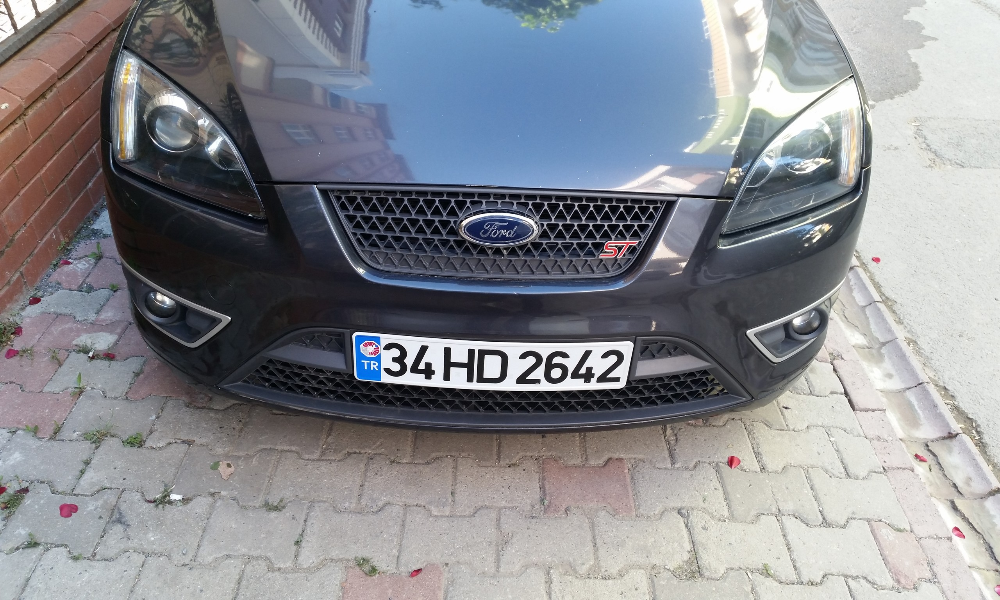

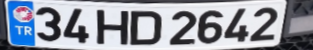

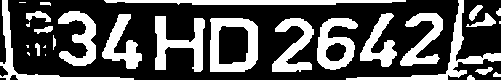


license plate read from image = 34HD2642

----------------------------------------


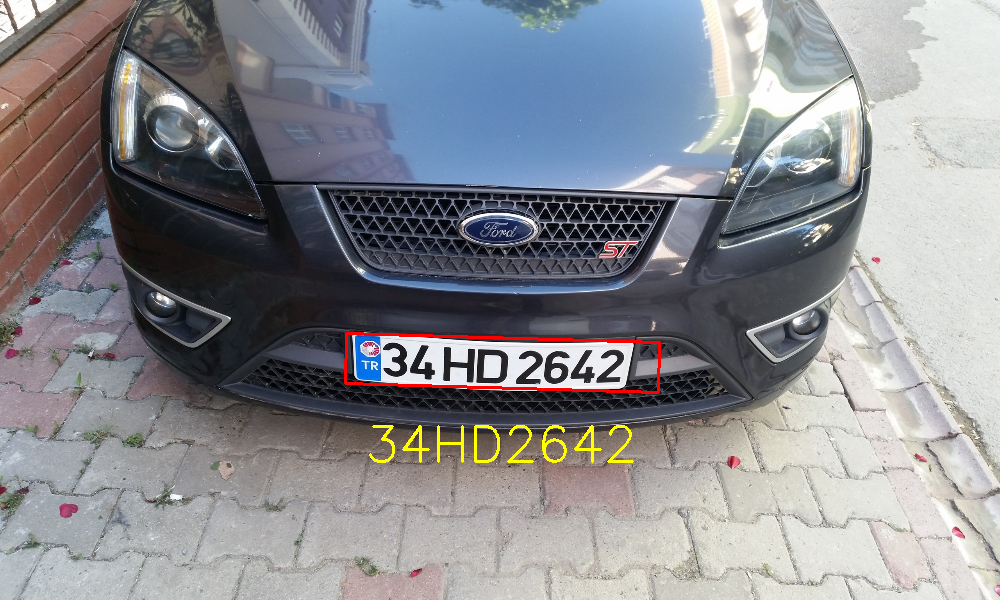

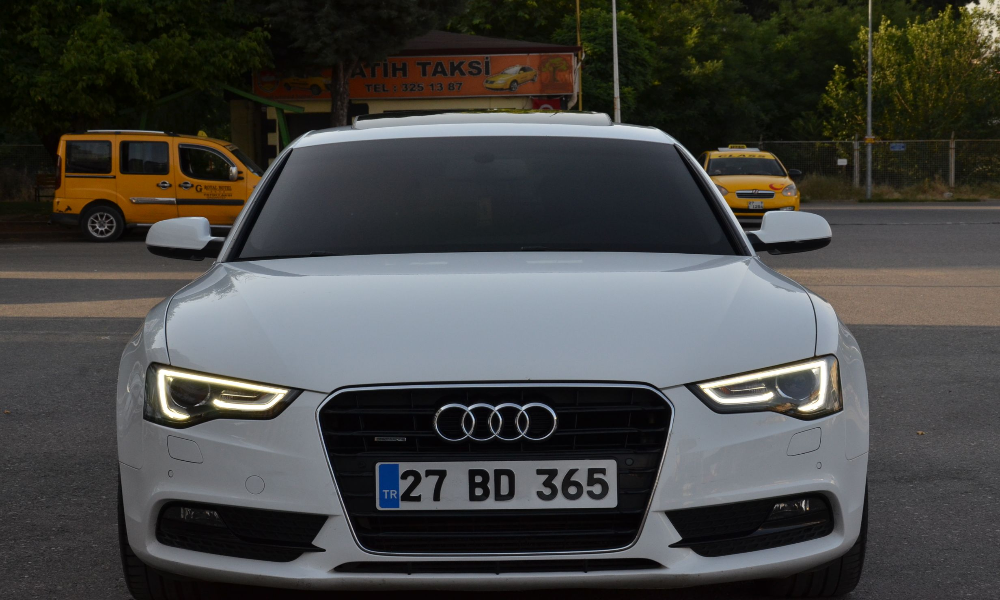

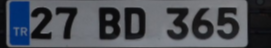

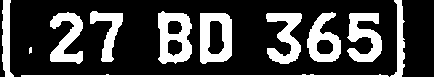


license plate read from image = 27BD365

----------------------------------------


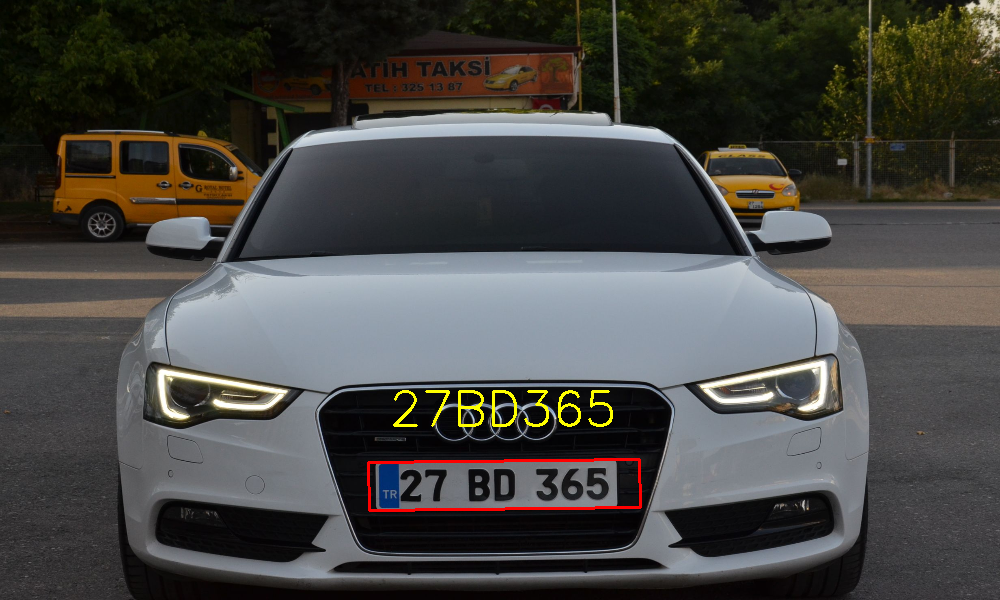

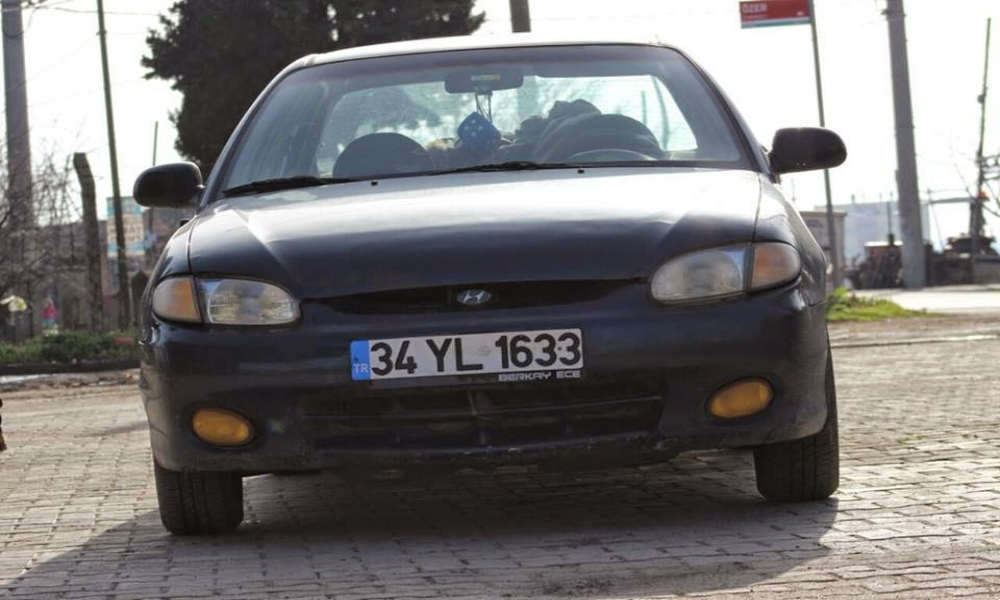

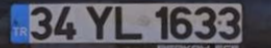

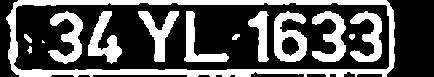


license plate read from image = 34YL1633

----------------------------------------


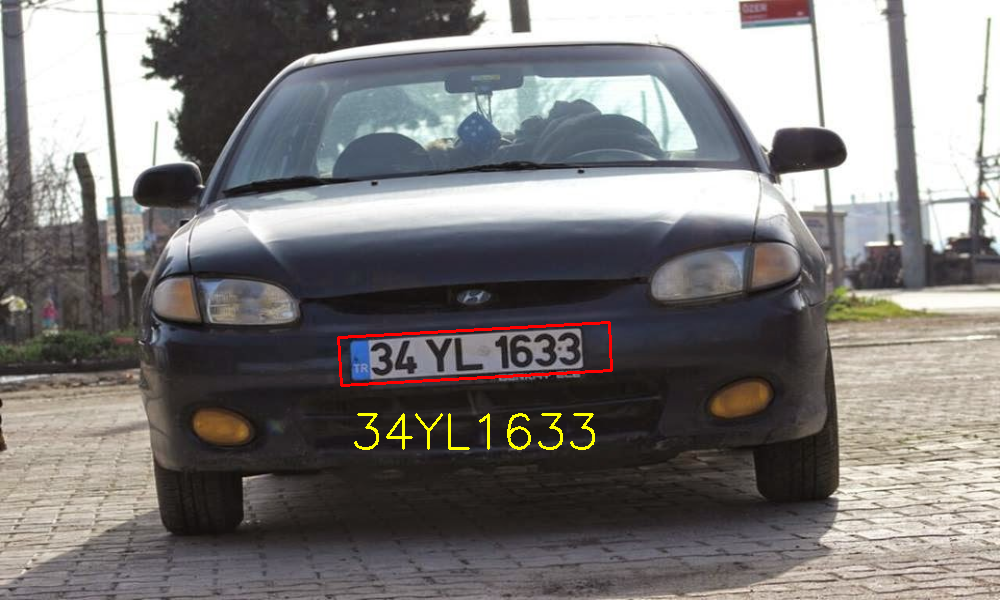

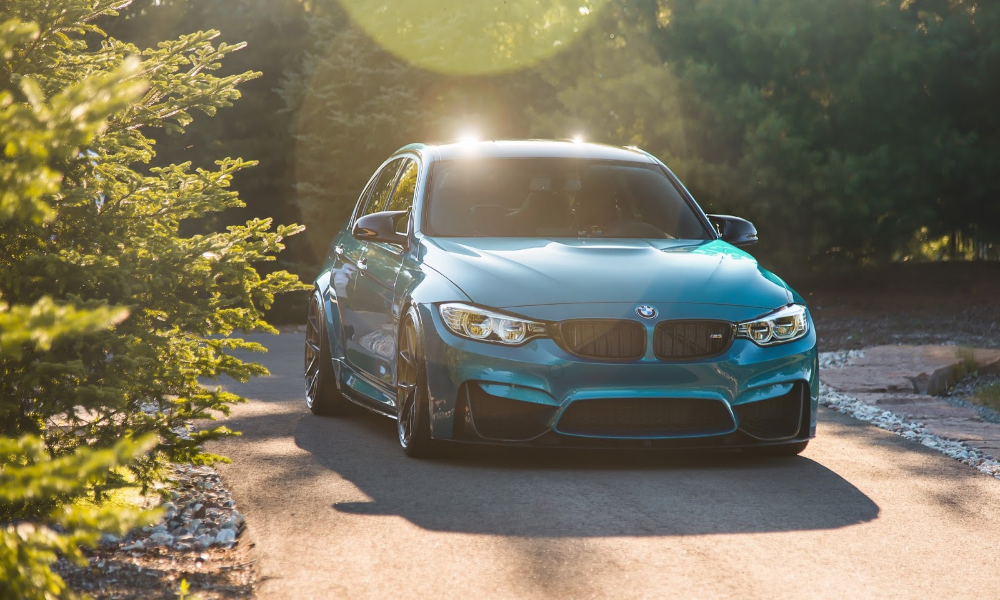


no license plates were detected



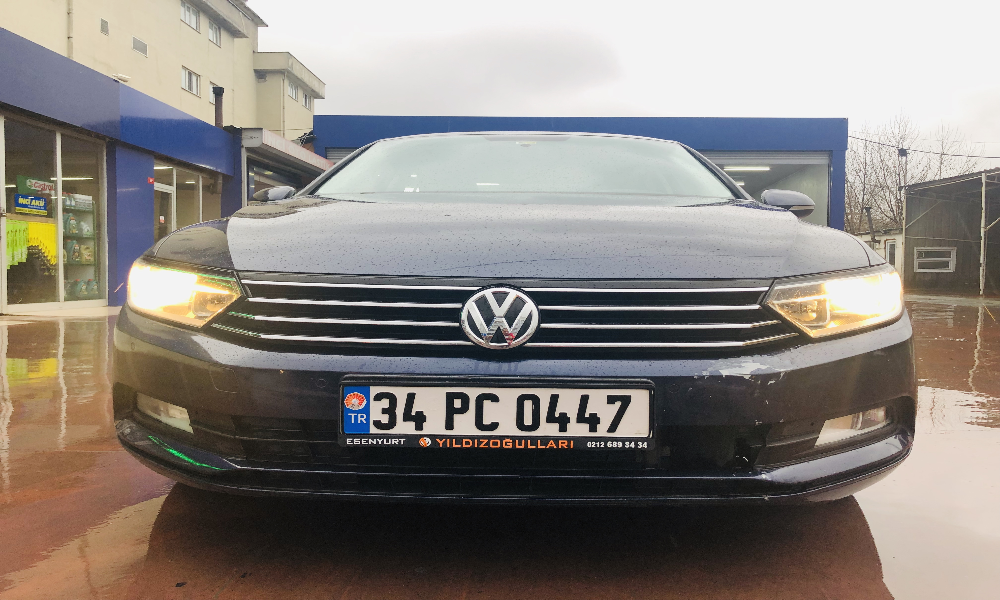

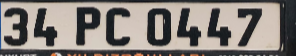

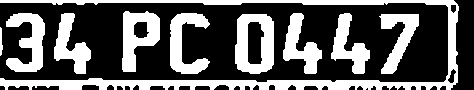


license plate read from image = 4PC0447

----------------------------------------


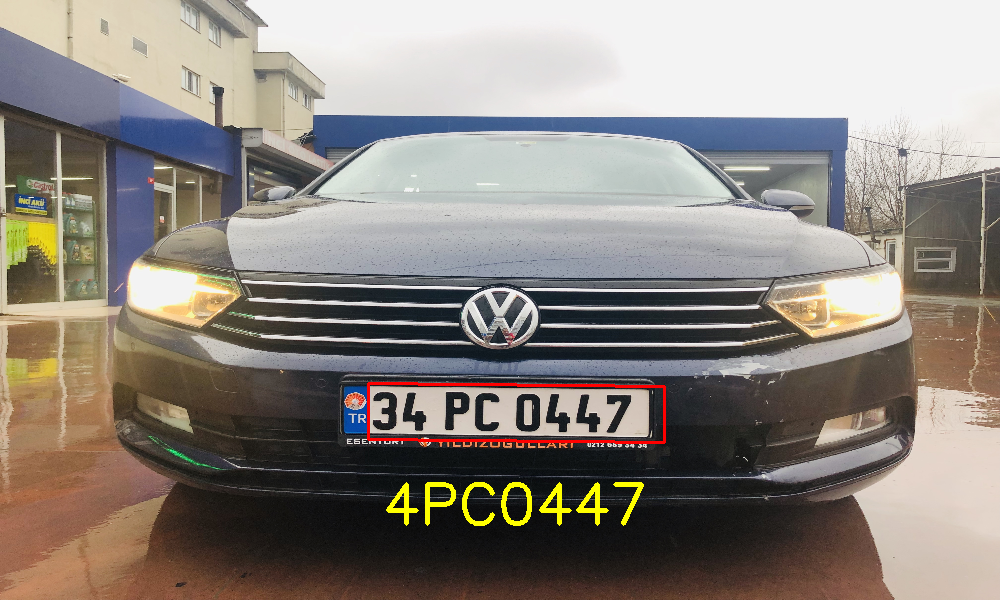

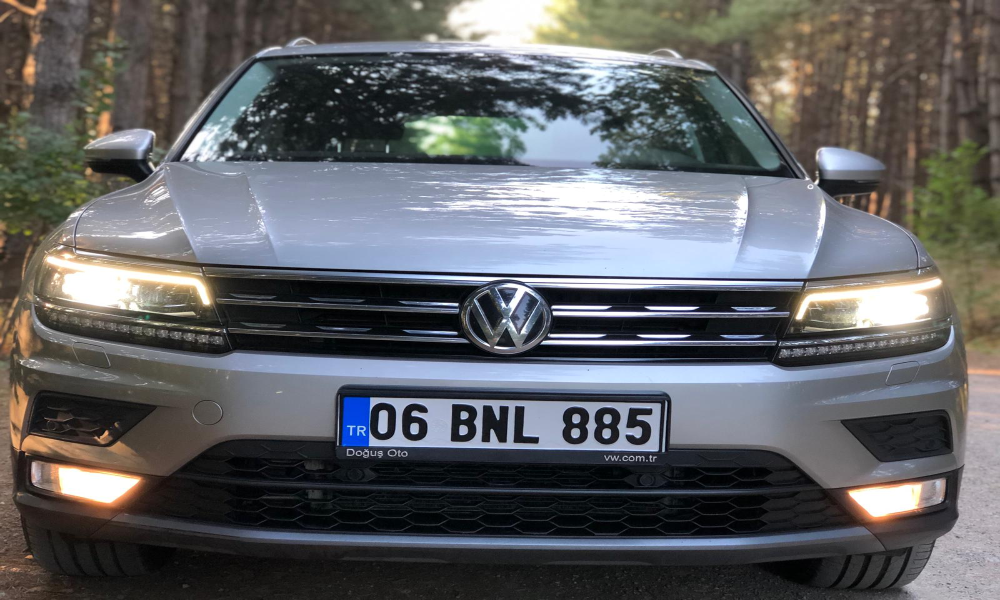

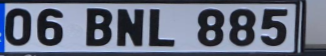

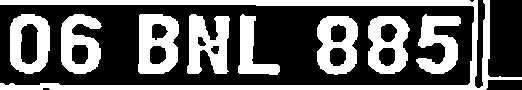


license plate read from image = 6BNL885

----------------------------------------


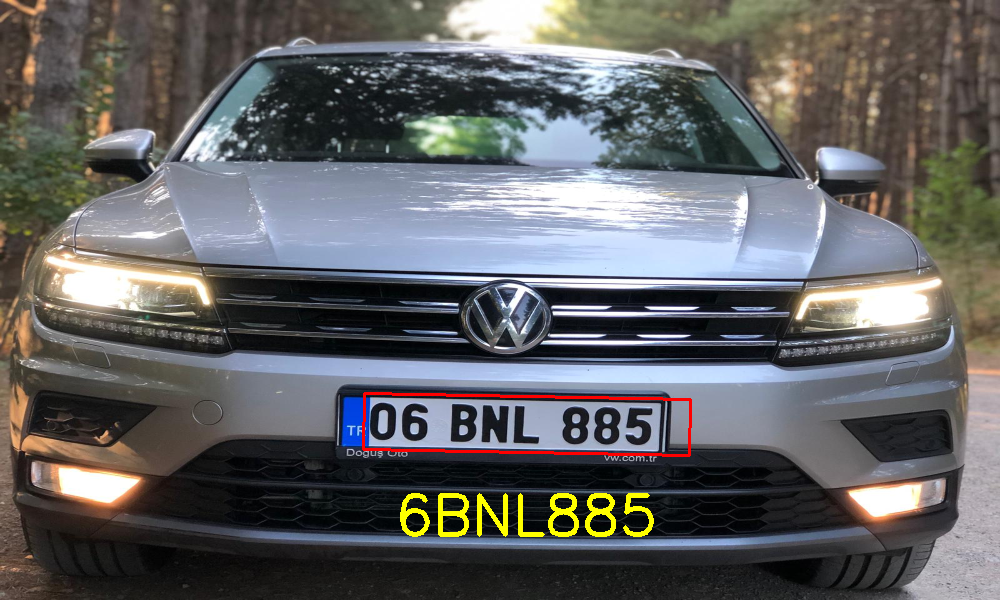

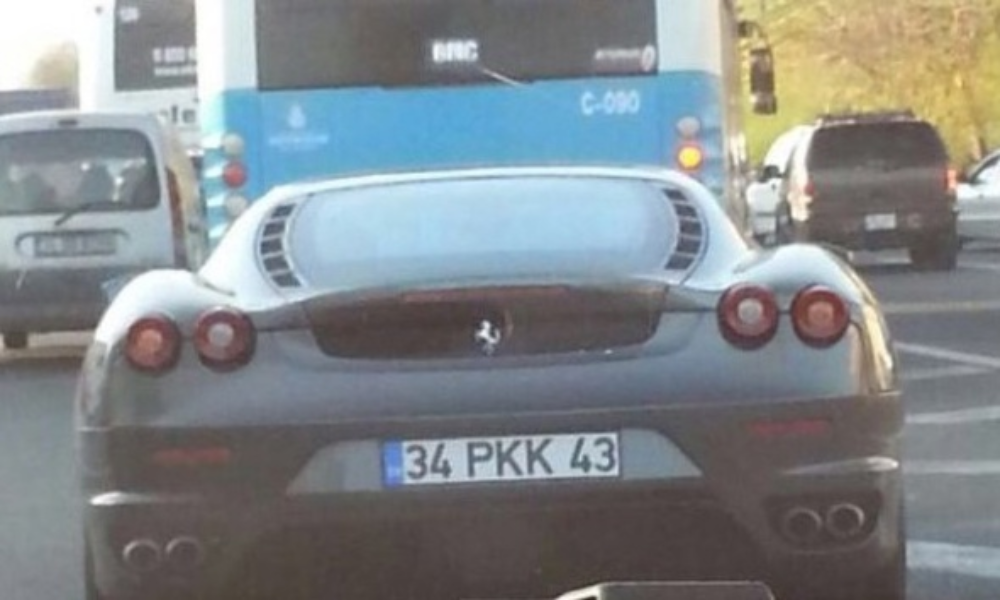

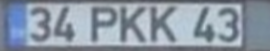

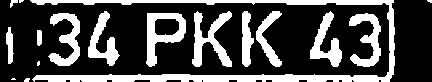


license plate read from image = 34PK443

----------------------------------------


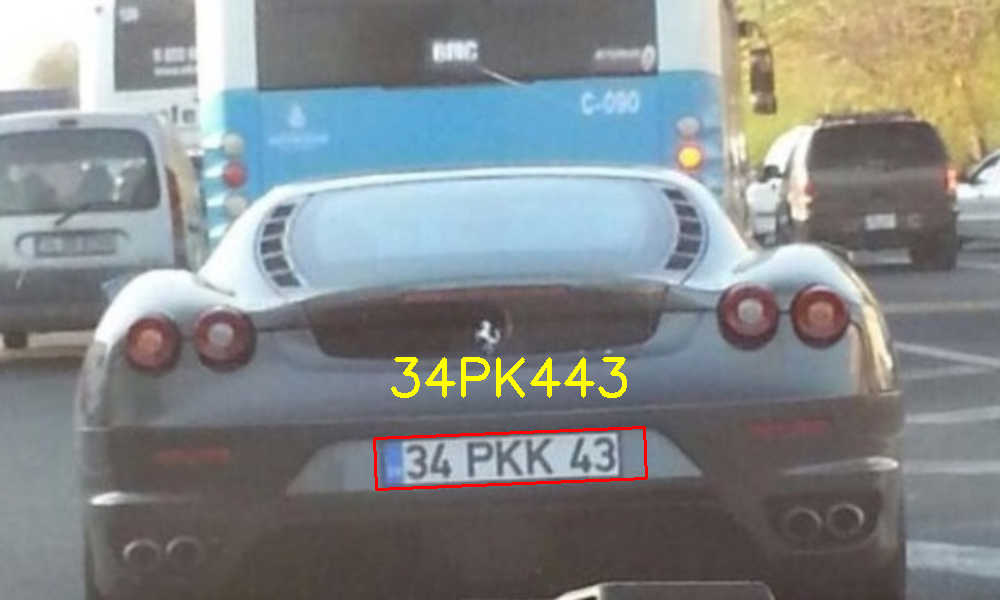

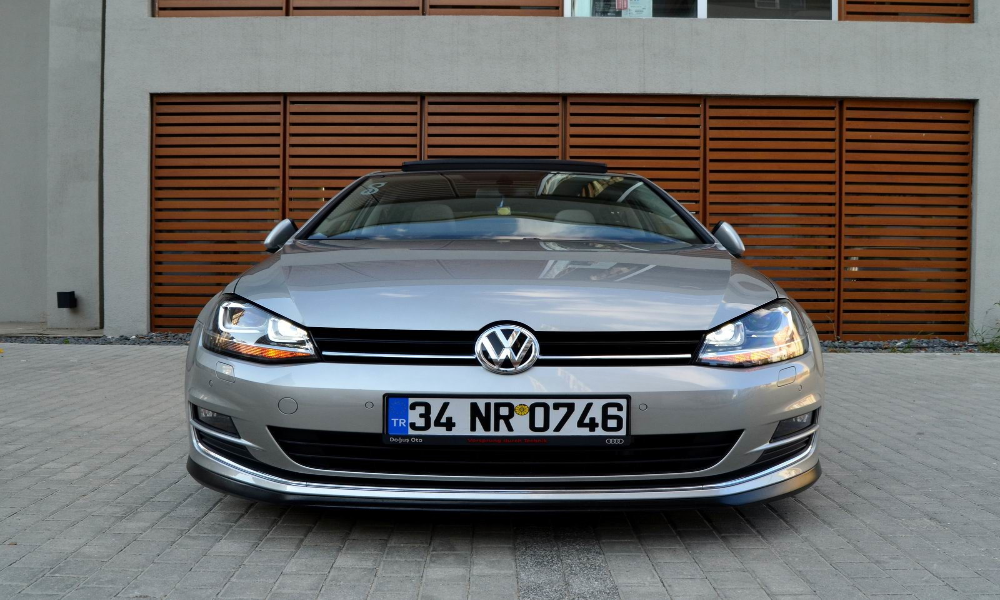

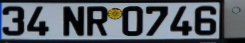

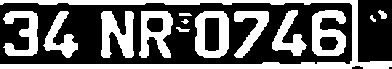


license plate read from image = 34NR074B

----------------------------------------


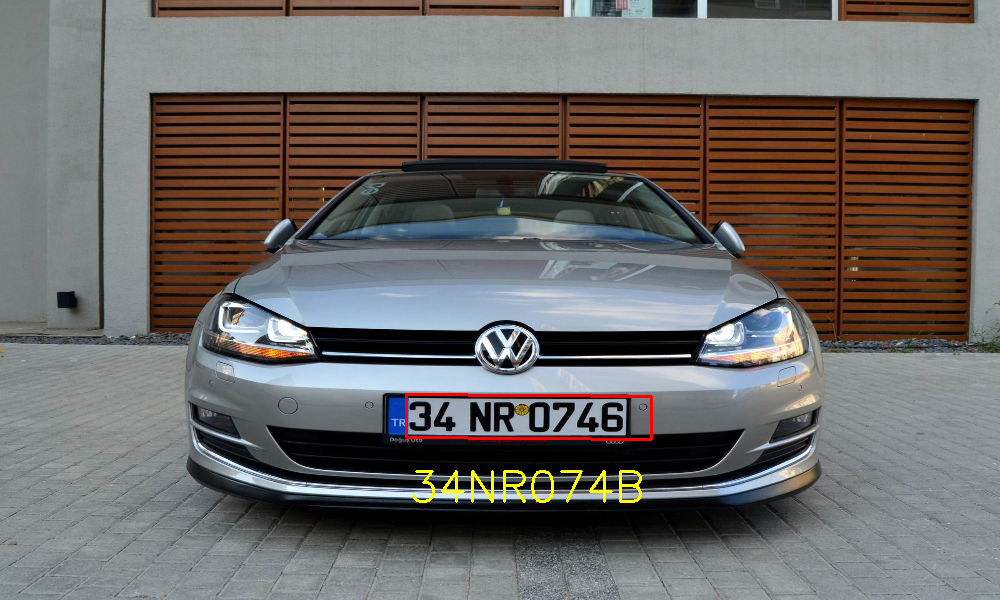

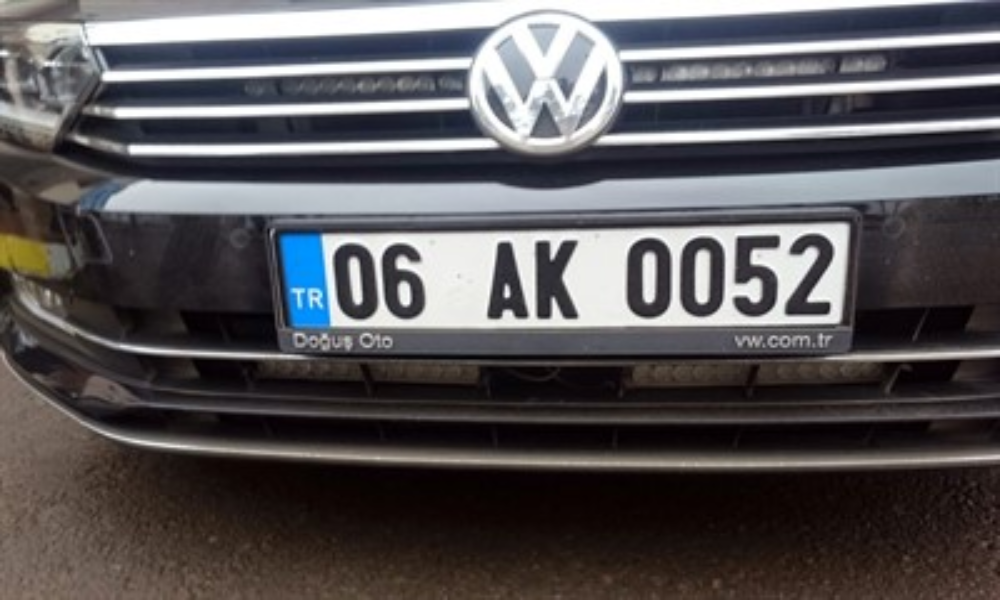

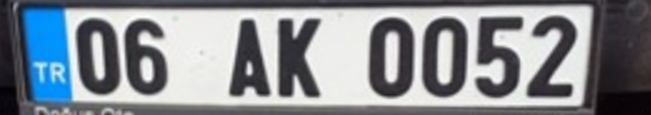

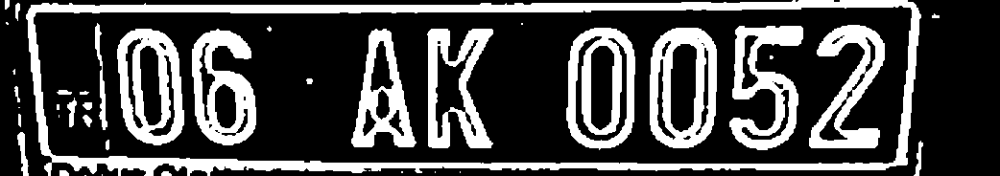


license plate read from image = 06AX8052

----------------------------------------


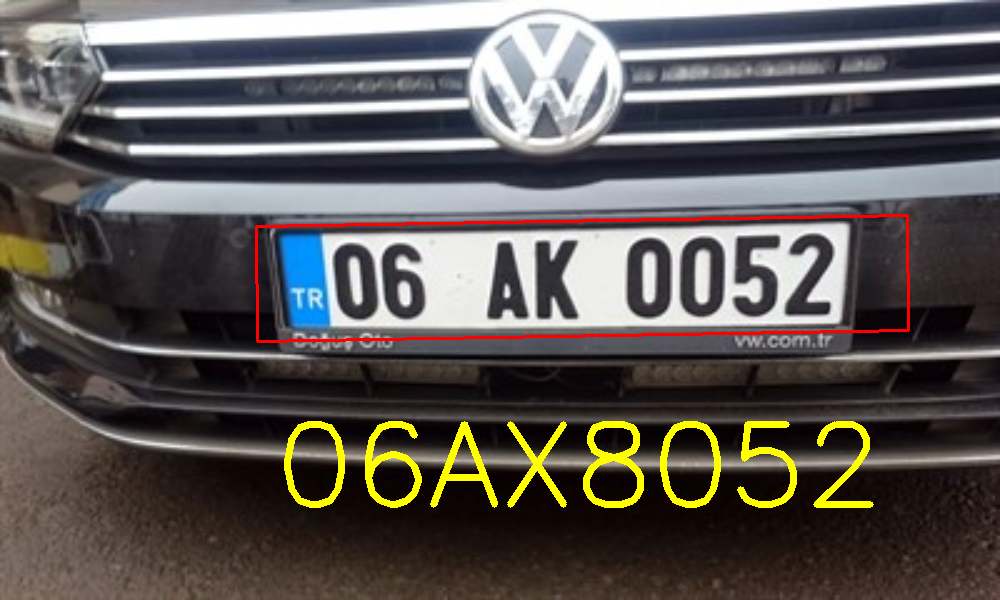

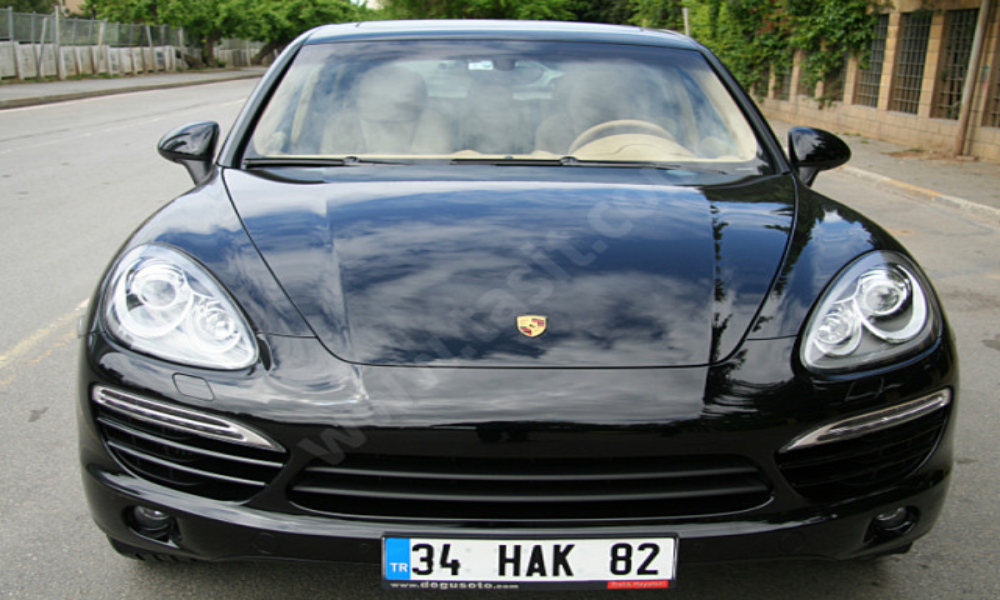

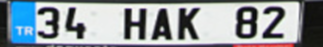

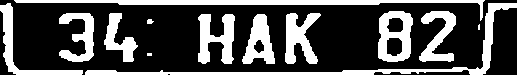


license plate read from image = 34HIK82

----------------------------------------


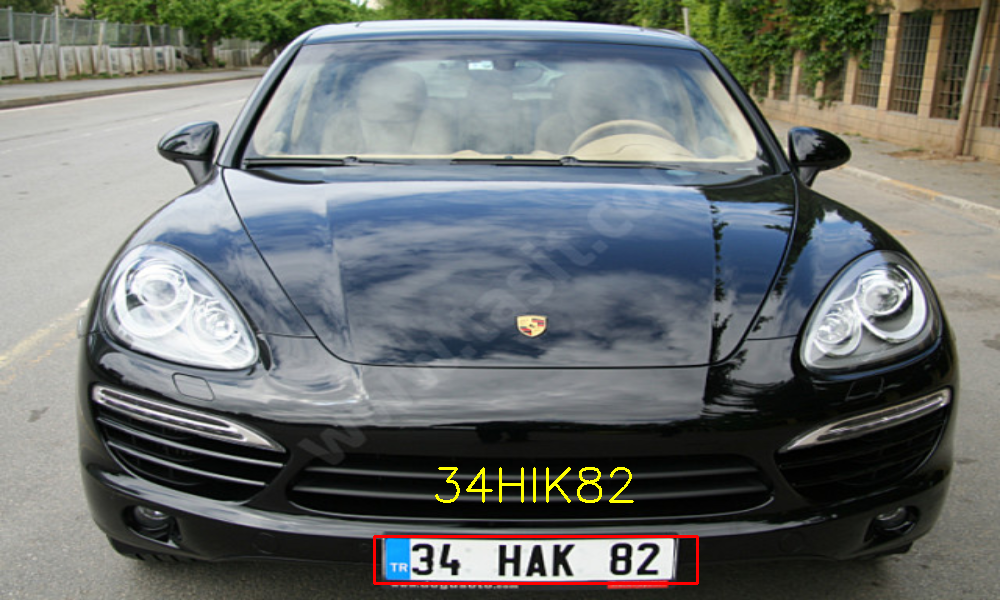

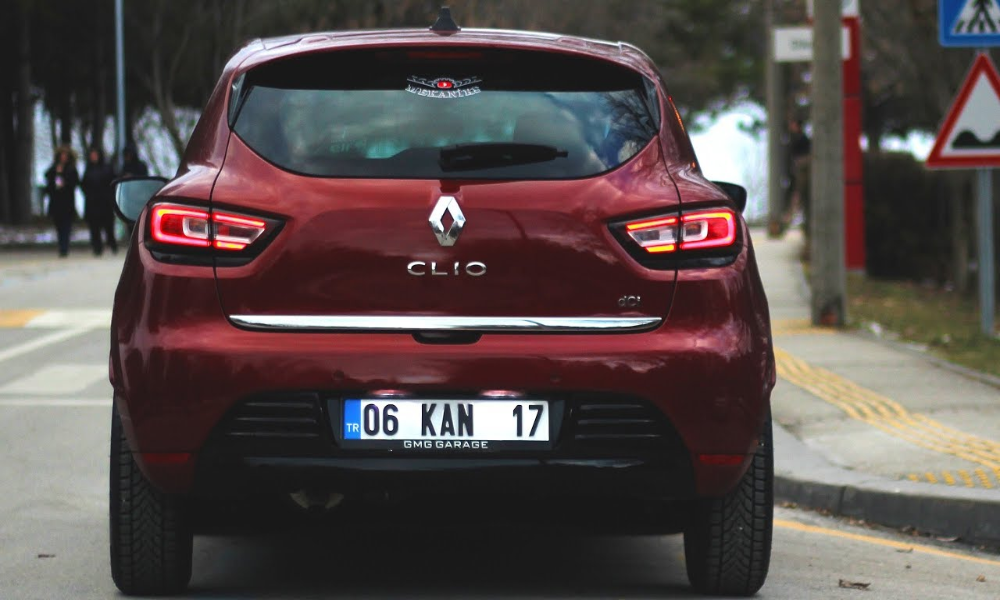

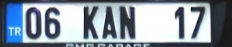

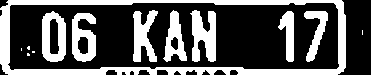


license plate read from image = 06KAN17

----------------------------------------


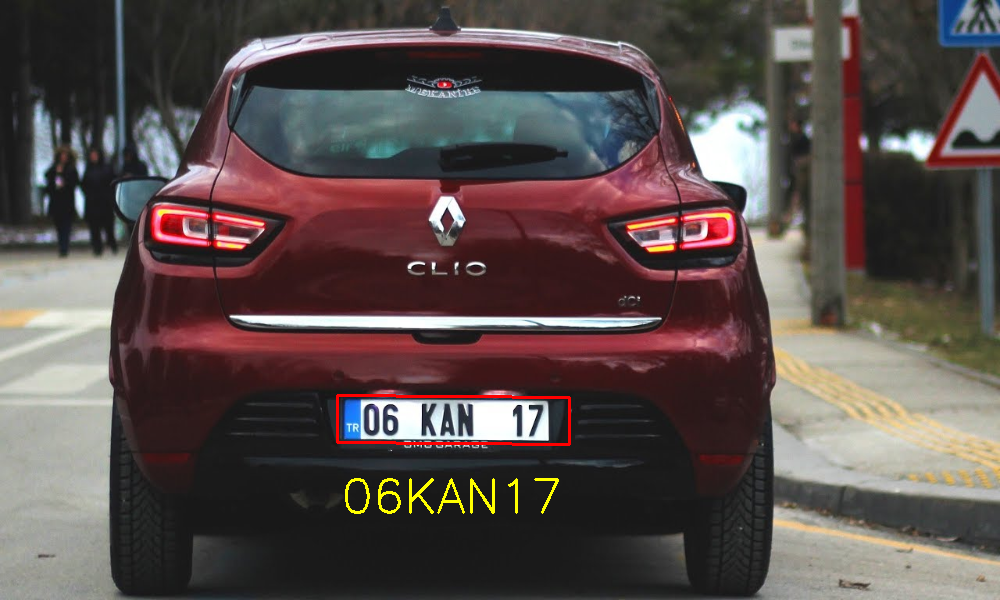

In [0]:
SCALAR_BLACK = (0.0, 0.0, 0.0)
SCALAR_WHITE = (255.0, 255.0, 255.0)
SCALAR_YELLOW = (0.0, 255.0, 255.0)
SCALAR_GREEN = (0.0, 255.0, 0.0)
SCALAR_RED = (0.0, 0.0, 255.0)


def drawRedRectangleAroundPlate(imgOriginalScene, licPlate):

    p2fRectPoints = cv2.boxPoints(licPlate.rrLocationOfPlateInScene)            # get 4 vertices of rotated rect

    cv2.line(imgOriginalScene, tuple(p2fRectPoints[0]), tuple(p2fRectPoints[1]), SCALAR_RED, 2)         # draw 4 red lines
    cv2.line(imgOriginalScene, tuple(p2fRectPoints[1]), tuple(p2fRectPoints[2]), SCALAR_RED, 2)
    cv2.line(imgOriginalScene, tuple(p2fRectPoints[2]), tuple(p2fRectPoints[3]), SCALAR_RED, 2)
    cv2.line(imgOriginalScene, tuple(p2fRectPoints[3]), tuple(p2fRectPoints[0]), SCALAR_RED, 2)


def writeLicensePlateCharsOnImage(imgOriginalScene, licPlate):
    ptCenterOfTextAreaX = 0                             # this will be the center of the area the text will be written to
    ptCenterOfTextAreaY = 0

    ptLowerLeftTextOriginX = 0                          # this will be the bottom left of the area that the text will be written to
    ptLowerLeftTextOriginY = 0

    sceneHeight, sceneWidth, sceneNumChannels = imgOriginalScene.shape
    plateHeight, plateWidth, plateNumChannels = licPlate.imgPlate.shape

    intFontFace = cv2.FONT_HERSHEY_SIMPLEX                      # choose a plain jane font
    fltFontScale = float(plateHeight) / 30.0                    # base font scale on height of plate area
    intFontThickness = int(round(fltFontScale * 1.5))           # base font thickness on font scale

    textSize, baseline = cv2.getTextSize(licPlate.strChars, intFontFace, fltFontScale, intFontThickness)        # call getTextSize

            # unpack roatated rect into center point, width and height, and angle
    ( (intPlateCenterX, intPlateCenterY), (intPlateWidth, intPlateHeight), fltCorrectionAngleInDeg ) = licPlate.rrLocationOfPlateInScene

    intPlateCenterX = int(intPlateCenterX)              # make sure center is an integer
    intPlateCenterY = int(intPlateCenterY)

    ptCenterOfTextAreaX = int(intPlateCenterX)         # the horizontal location of the text area is the same as the plate

    if intPlateCenterY < (sceneHeight * 0.75):                                                  # if the license plate is in the upper 3/4 of the image
        ptCenterOfTextAreaY = int(round(intPlateCenterY)) + int(round(plateHeight * 1.6))      # write the chars in below the plate
    else:                                                                                       # else if the license plate is in the lower 1/4 of the image
        ptCenterOfTextAreaY = int(round(intPlateCenterY)) - int(round(plateHeight * 1.6))      # write the chars in above the plate
    

    textSizeWidth, textSizeHeight = textSize                # unpack text size width and height

    ptLowerLeftTextOriginX = int(ptCenterOfTextAreaX - (textSizeWidth / 2))           # calculate the lower left origin of the text area
    ptLowerLeftTextOriginY = int(ptCenterOfTextAreaY + (textSizeHeight / 2))          # based on the text area center, width, and height

            # write the text on the image
    cv2.putText(imgOriginalScene, licPlate.strChars, (ptLowerLeftTextOriginX, ptLowerLeftTextOriginY), intFontFace, fltFontScale, SCALAR_YELLOW, intFontThickness)


def detect(filename):
    
    imgOriginalScene  = cv2.imread("drive/OPLOG/test/" + filename +".jpg")               # open image

    imgOriginalScene = cv2.resize(imgOriginalScene,(1000,600))

    if imgOriginalScene is None:                            # if image was not read successfully
        print("\nerror: image not read from file \n\n")  # print error message to std out
        os.system("pause")                                  # pause so user can see error message
        return                                              # and exit program


    listOfPossiblePlates = detectPlatesInScene(imgOriginalScene)           # detect plates

    listOfPossiblePlates = detectCharsInPlates(listOfPossiblePlates)        # detect chars in plates

    cv2_imshow(imgOriginalScene)            # show scene image

    if len(listOfPossiblePlates) == 0:                          # if no plates were found
        print("\nno license plates were detected\n")  # inform user no plates were found
    else:                                                       # else
                # if we get in here list of possible plates has at leat one plate

                # sort the list of possible plates in DESCENDING order (most number of chars to least number of chars)
        listOfPossiblePlates.sort(key = lambda possiblePlate: len(possiblePlate.strChars), reverse = True)

                # suppose the plate with the most recognized chars (the first plate in sorted by string length descending order) is the actual plate
        licPlate = listOfPossiblePlates[0]

        cv2_imshow(licPlate.imgPlate)           # show crop of plate and threshold of plate
        cv2_imshow(licPlate.imgThresh)

        if len(licPlate.strChars) == 0:                     # if no chars were found in the plate
            print("\nno characters were detected\n\n")  # show message
            return                                          # and exit program

        drawRedRectangleAroundPlate(imgOriginalScene, licPlate)             # draw red rectangle around plate

        print("\nlicense plate read from image = " + licPlate.strChars + "\n")  # write license plate text to std out
        print("----------------------------------------")

        writeLicensePlateCharsOnImage(imgOriginalScene, licPlate)           # write license plate text on the image

        cv2_imshow(imgOriginalScene)                # re-show scene image

    #cv2.waitKey(0)					# hold windows open until user presses a key
    
    
    return


showSteps = TRAIN_RULE  # change it True if you want to see all steps
#cv2_imshow() is working very slow if we want to speed we can remove cv2_imshow()'s
for i in range(1,12):
  detect(str(i))